#  Zeisel mouse brain (STRT-Seq) workflow

This is a reimplemintation of the [Zeisel mouse brain workflow from OSCA Ch. 24](https://osca.bioconductor.org/zeisel-mouse-brain-strt-seq.html). Analysis is done here using both R Bioconductor (implemented with rpy2) and the Python [Scanpy package](https://icb-scanpy.readthedocs-hosted.com/en/stable/api/index.html). Components drawn from the [Theis Lab Scanpy Single Cell Tutorial](https://github.com/theislab/single-cell-tutorial).

From OSCA:

Here, we examine a heterogeneous dataset from a study of cell types in the mouse brain (Zeisel et al. 2015). This contains approximately 3000 cells of varying types such as oligodendrocytes, microglia and neurons. Individual cells were isolated using the Fluidigm C1 microfluidics system (Pollen et al. 2014) and library preparation was performed on each cell using a UMI-based protocol. After sequencing, expression was quantified by counting the number of unique molecular identifiers (UMIs) mapped to each gene.

## 0. Load packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.spatial import distance
import seaborn as sns
sns.set()

import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri
from rpy2.robjects import r

In [2]:
# Ignore R warning messages
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes, and activate anndata2ri 
# for converting to/from AnnData objects
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

# Set up scanpy settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=120)

scanpy==1.4.5.post2 anndata==0.7.1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
%%R
# Load all the required R libraries
library(scran)
library(scRNAseq)
library(scater)
library(org.Mm.eg.db)

## 1. Data loading and quality control
All done in R.

In [4]:
%%R
sce.zeisel <- ZeiselBrainData()
sce.zeisel <- sce.zeisel[rowData(sce.zeisel)$featureType!="repeat",]

adata <- aggregateAcrossFeatures(sce.zeisel, 
    id=sub("_loc[0-9]+$", "", rownames(sce.zeisel)))

ensembl <- mapIds(org.Mm.eg.db, keys=rownames(sce.zeisel), 
    keytype="SYMBOL", column="ENSEMBL")
rowData(sce.zeisel)$ENSEMBL <- ensembl

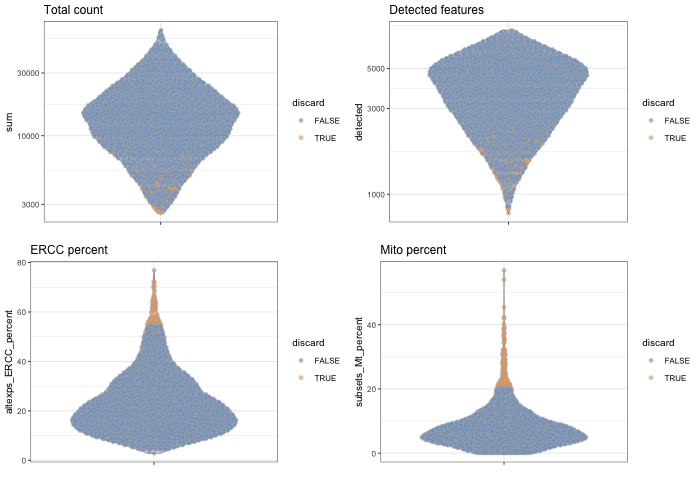

In [5]:
%%R -w 700
unfiltered <- sce.zeisel

stats <- perCellQCMetrics(sce.zeisel, subsets=list(
    Mt=rowData(sce.zeisel)$featureType=="mito"))
qc <- quickPerCellQC(stats, percent_subsets=c("altexps_ERCC_percent", 
    "subsets_Mt_percent"))
sce.zeisel <- sce.zeisel[,!qc$discard]

colData(unfiltered) <- cbind(colData(unfiltered), stats)
unfiltered$discard <- qc$discard

gridExtra::grid.arrange(
    plotColData(unfiltered, y="sum", colour_by="discard") +
        scale_y_log10() + ggtitle("Total count"),
    plotColData(unfiltered, y="detected", colour_by="discard") +
        scale_y_log10() + ggtitle("Detected features"),
    plotColData(unfiltered, y="altexps_ERCC_percent",
        colour_by="discard") + ggtitle("ERCC percent"),
    plotColData(unfiltered, y="subsets_Mt_percent",
        colour_by="discard") + ggtitle("Mito percent"),
    ncol=2
)

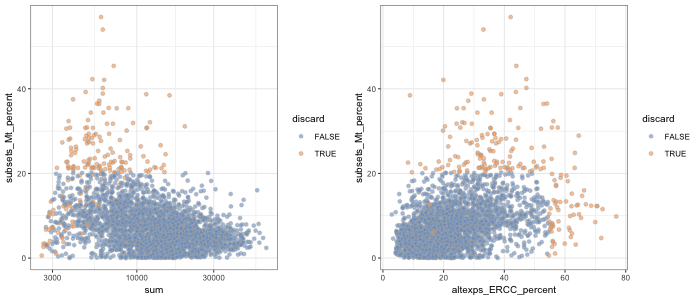

In [6]:
%%R -w 700 -h 300
gridExtra::grid.arrange(
    plotColData(unfiltered, x="sum", y="subsets_Mt_percent",
        colour_by="discard") + scale_x_log10(),
    plotColData(unfiltered, x="altexps_ERCC_percent", y="subsets_Mt_percent",
        colour_by="discard"),
    ncol=2
)

## 2. Normalization
At this point, we convert the R SingleCellExperiment to a Python AnnData object. Scanpy only provides normalization by library size, so we use the R scran package for normalization by deconvolution.

In [32]:
%%R -o adata

# Convert to AnnData object
adata <- as(sce.zeisel, 'SingleCellExperiment')

In [33]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, inplace=True)

In [34]:
# Perform a clustering for scran normalization
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp, key_added='lib_size_factors')
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added='groups', resolution=0.5)

normalizing counts per cell
    finished (0:00:00)
computing PCA with n_comps = 15
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:00)


In [35]:
# Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

In [36]:
%%R -i data_mat,input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [37]:
adata.obs['size_factors'] = size_factors
#sc.pp.normalize_total(adata_pp, key_added='lib_size_factors')
adata.obs['lib_size_factors'] = adata_pp.obs['lib_size_factors']

del adata_pp

# Lognormalize the data
sc.pp.log1p(adata)

adata.obs['size_factors'].describe()

count    2816.000000
mean        1.000000
std         0.696059
min         0.128957
25%         0.471619
50%         0.828994
75%         1.327055
max         4.804985
Name: size_factors, dtype: float64

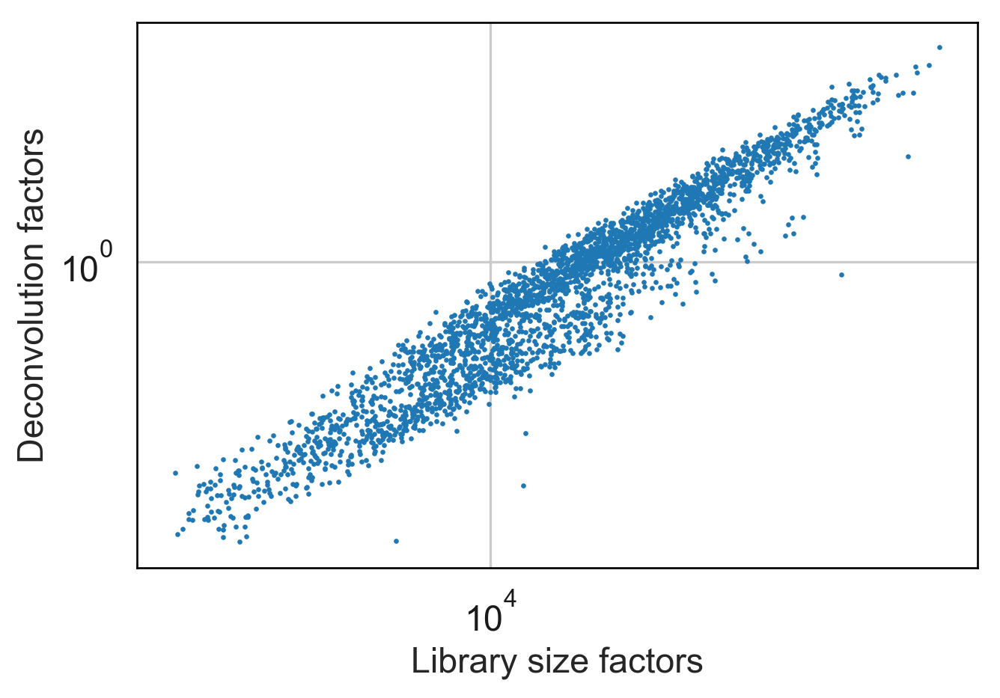

In [38]:
fig, ax = plt.subplots(figsize = (6,4))
ax.scatter(adata.obs['lib_size_factors'],adata.obs['size_factors'],s=1)
ax.set_ylabel('Deconvolution factors')
ax.set_xlabel('Library size factors')
ax.set_xscale('log')
ax.set_yscale('log')

## 3. Variance modeling
Done here in scanpy.

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


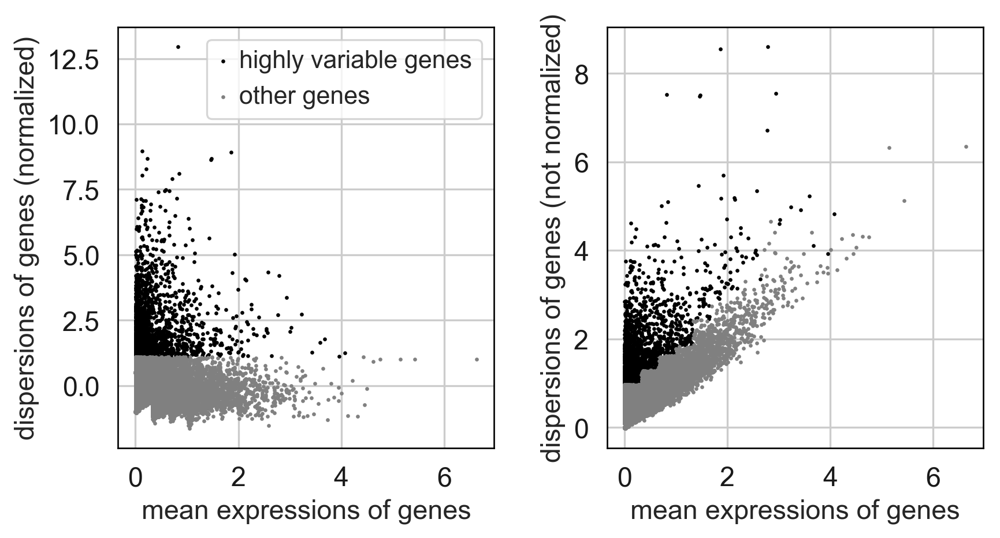

In [39]:
# top 10 percent of genes
n_genes = int(adata.X.shape[1]*0.1)

sc.pp.highly_variable_genes(adata, n_top_genes = n_genes)
sc.pl.highly_variable_genes(adata)

## 4. Dimensionality reduction
Done with scanpy.

In [40]:
sc.pp.pca(adata,use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.tsne(adata,random_state = 101011001)

computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:13)


## 5. Clustering
Leiden clustering with scanpy.

In [41]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


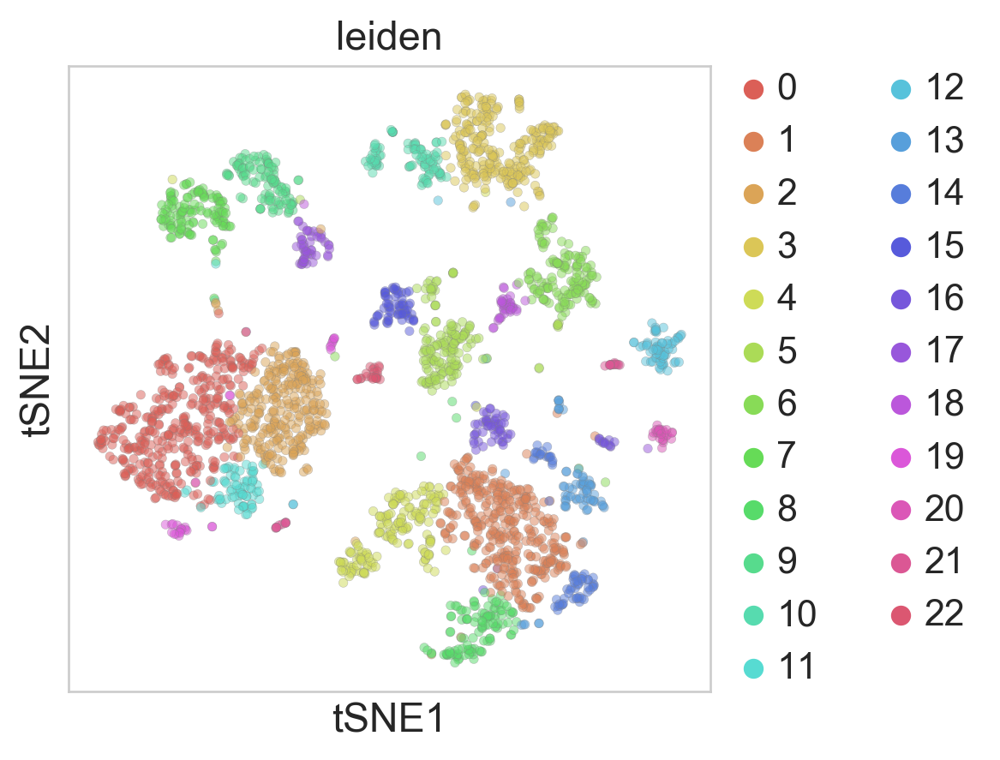

In [61]:
with sns.axes_style('whitegrid'):
    sc.pl.tsne(adata,color='leiden',palette=sns.color_palette("hls", 23),size=40,alpha=0.5,
           edgecolor='gray',linewidth=0.15)

In [50]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


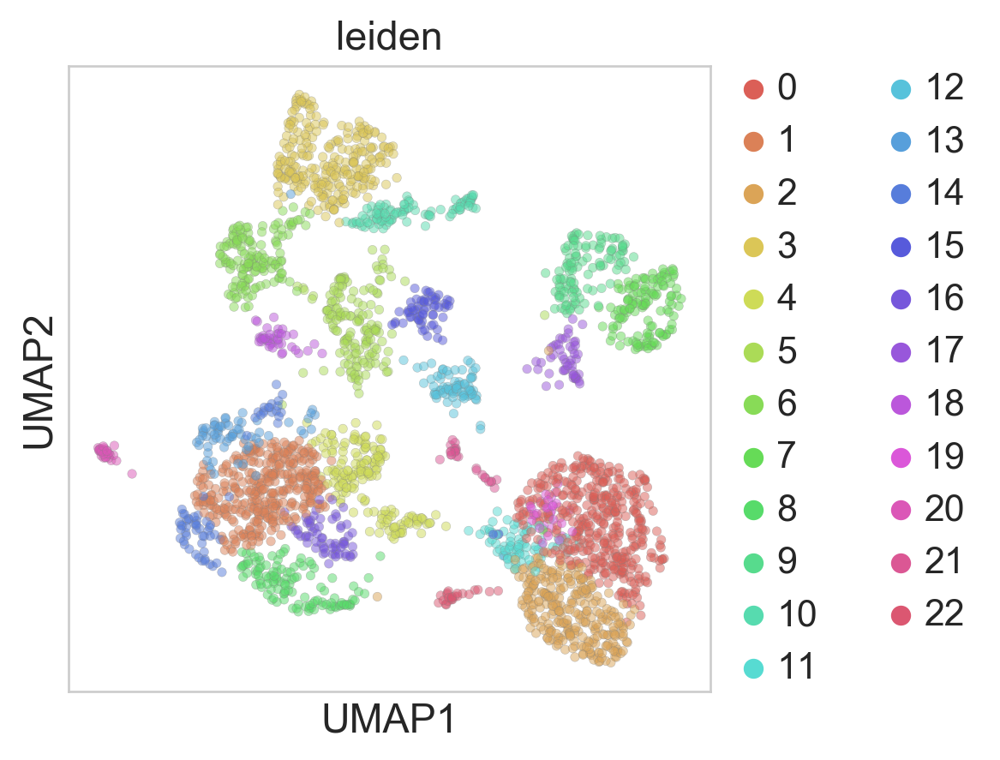

In [60]:
with sns.axes_style('whitegrid'):
    sc.pl.umap(adata, color='leiden',size=40,palette=sns.color_palette("hls", 23),alpha=0.5,
           edgecolor='gray',linewidth=0.15)

## 6. Interpretation

In [62]:
# Calculate marker genes
sc.tl.rank_genes_groups(adata, groupby='leiden', n_genes=10)
sc.tl.dendrogram(adata,groupby='leiden')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


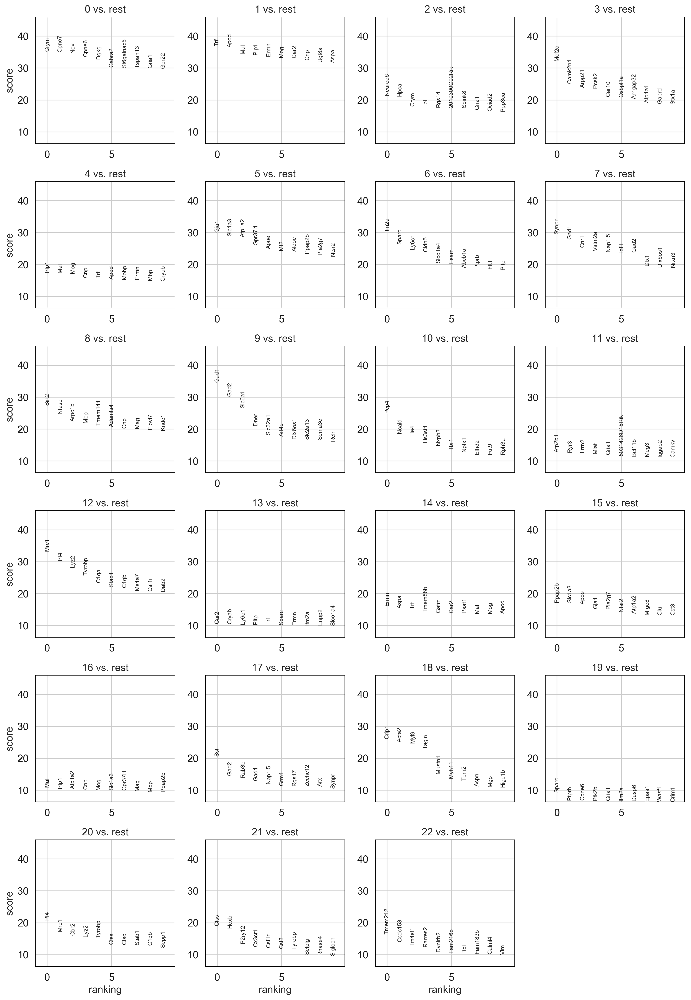

In [63]:
sc.pl.rank_genes_groups(adata)

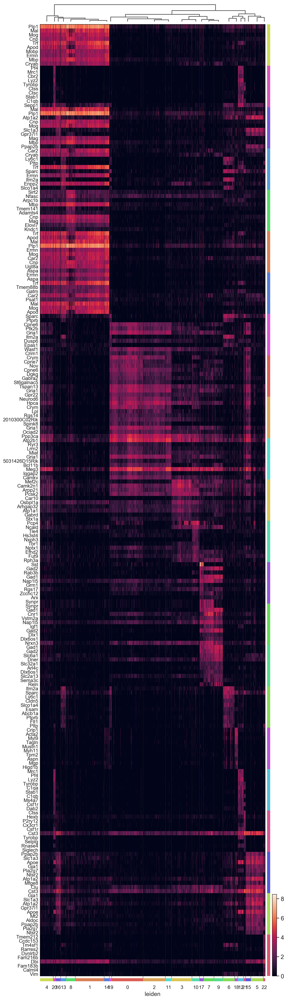

In [64]:
sc.pl.rank_genes_groups_heatmap(adata,groupby='leiden',swap_axes=True,show_gene_labels=True)

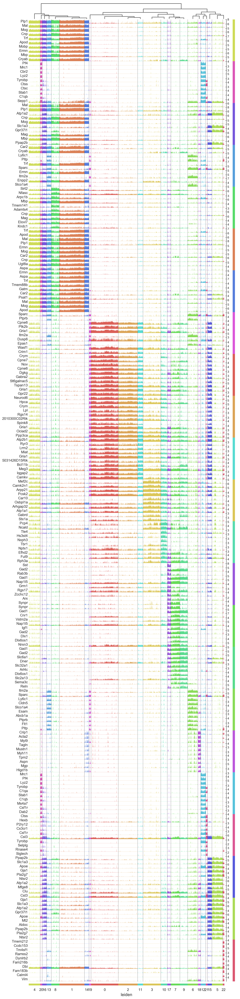

In [65]:
sc.pl.rank_genes_groups_tracksplot(adata,groupby='leiden',show_gene_labels=True)